## Import Library

In [2]:
import os
import re
import string
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

pd.set_option('display.max_columns', None)

## Load dataset

In [3]:
import pickle

data_filename = 'GSPP11_data_merge'

try:
    data_df = pickle.load(open(data_filename + '.pickle', 'rb'))
except (OSError, IOError) as e:
    data_df = pd.read_excel(data_filename + '.xlsx')
    pickle.dump(data_df, open(data_filename + '.pickle', 'wb'))

# data_df.head()

## Prepare dataset

In [4]:
data_df['Condition'] = [0 if val == 'Normal' else 1 for val in data_df['Condition']]
data_df.iloc[:, 3:] = data_df.iloc[:, 3:].apply(pd.to_numeric, errors='coerce')

# Fill all NaN with value = 0
nan_df = data_df[data_df.isnull().any(axis=1)]
data_df.iloc[:, 3:] = data_df.iloc[:, 3:].fillna(0)

data_df

,Date,Condition,GT Number,GT ACTIVE POWER,AMBIENT PRESSURE SELECTED VALUE 1,AMBIENT PRESSURE SELECTED VALUE 2,AMBIENT PRESSURE Point 1,AMBIENT PRESSURE Point 2,GT INLET SCREEN DIFF. PRESS.,GT INLET AIR DIFF. PRESS.,GT INLET FILTER HOUSE AIR TEMP. 1,GT INLET FILTER HOUSE AIR TEMP. 2,GT INLET FILTER HOUSE AIR HUMIDITY 1,GT INLET FILTER HOUSE AIR HUMIDITY 2,No.1 GT CHILLED WATER SUPPLY TEMP.,SPRINT WATER FLOW,LP SPRINT TOTAL WATER FLOW,LP SPRINT OPERATION HOUR,VIGV POSITION SELECTED,#1 VIGV POSITION,#2 VIGV POSITION,VBVBEL POSITION SELECTED,VSVSEL POSITION SELECTED,No.1 INLET AIR HEATER LEVEL CV POS. DEMAND,LP COMP. INLET TEMP. (T2) SELECTED,GT INLET TEMP. (T10) SELECTED,HP COMP. INLET TEMP. (T25) SELECTED,HP COMP. DISCH. TEMP. (T3) SELECTED,#1 HP COMP. INLET PRESS. (P25),#2 HP COMP. INLET PRESS. (P25),#1 HP COMP. DISCH. PRESS. (PS3),#2 HP COMP. DISCH. PRESS. (PS3),LP TURBINE INLET TEMP. (T48) SELECTED,DIFFERENACE OF T48MAX AND T48MIN,HP ROTOR SPEED (XN25) SELECTED,LP ROTOR SPEED (XNSD) SELECTED,Fuel Gas Volume Flow,LOWER HEATING VALUE 1,LOWER HEATING VALUE 2,Fuel Specific Gravity Selected,Compressibility Factor Selected,FUEL GAS SUPPLY PRESS.,FUEL GAS SUPPLY TEMP. SELECTED,Curnt. Methane (C1),Curnt. Ethane (C2),Curnt. Propane (C3),Curnt. i-Butane (iC4),Curnt. n-Butene (nC4),Curnt. i-Pentane (iC5),Curnt. n-Pentane (nC5),Curnt. Hexane Plus (C6+),Curnt. Nitrogen (N2),Curnt. Carbon Dioxide (CO2),HRSG INLET FUEL GAS PRESS.,HRSG INLET GAS DUCT TEMP. #1,HRSG INLET GAS DUCT TEMP. #2,HRSG OUTLET FUEL GAS PRESS.,HRSG OUTLET GAS DUCT TEMP. #1,HRSG OUTLET GAS DUCT TEMP. #2,LP TURBINE INLET TEMP. (T48) A,LP TURBINE INLET TEMP. (T48) B,LP TURBINE INLET TEMP. (T48) C,LP TURBINE INLET TEMP. (T48) D,LP TURBINE INLET TEMP. (T48) E,LP TURBINE INLET TEMP. (T48) F,LP TURBINE INLET TEMP. (T48) G,LP TURBINE INLET TEMP. (T48) H
0,2019-01-01 00:00:00,0,1,24.961611,14.445444,14.466763,1002.279208,1002.764703,0.579197,-0.876408,24.942641,24.955787,58.258275,59.779050,44.426224,0.005570,98132.634463,465.728370,28.269185,28.804726,27.735972,13.471984,72.954904,72.223297,40.599394,41.138421,121.961115,530.589712,201.459786,201.734075,2061.697022,2064.664860,852.376481,24.547630,10089.833398,3629.223758,193.406986,45657.459423,45700.301860,0.594959,0.943591,4.360250,58.322947,95.124280,0.993676,0.109514,0.027650,0.026884,0.003666,0.002890,0.009909,1.968795,1.732711,0.097487,488.504492,486.230573,0.041327,89.307232,102.802245,847.066968,863.186131,853.090418,858.288423,838.633159,859.917953,847.319691,850.996004
1,2019-01-01 01:00:00,0,1,24.955444,14.449742,14.466154,1002.073566,1002.430513,0.577017,-0.874152,24.495615,24.543611,58.275939,60.006663,44.912449,0.005458,98132.645325,465.729958,28.258613,28.784903,27.733255,13.214311,72.702084,69.044871,40.933119,41.474002,122.625872,531.528906,201.763867,202.032457,2062.207612,2064.943401,852.605385,24.563439,10089.025464,3629.442142,193.345791,45608.743144,45649.098929,0.595003,0.943467,4.360398,58.372839,95.081885,1.016808,0.102702,0.025571,0.024688,0.002276,0.001772,0.009802,1.969856,1.764604,0.110897,488.856580,486.545500,0.029931,89.151650,102.703886,847.225598,863.341621,853.268686,858.476324,838.720686,860.321558,847.653442,851.321655
2,2019-01-01 02:00:00,0,1,25.000464,14.452401,14.465545,1001.667664,1002.095941,0.576373,-0.874066,23.527854,23.712178,60.139831,61.588245,44.869438,0.005346,98132.656186,465.731547,28.235135,28.751349,27.717824,13.006690,72.625770,70.603622,40.795232,41.373230,122.755831,531.591234,202.296723,202.565203,2064.342381,2067.248927,852.410639,24.377013,10087.886271,3630.881414,192.986560,45572.619074,45612.402519,0.595048,0.943500,4.360448,57.630118,95.046427,1.030336,0.104356,0.025849,0.025095,0.002420,0.001761,0.004824,1.960737,1.798180,0.099417,488.327492,486.011030,0.018535,89.075548,102.628714,847.218651,863.074201,853.051051,857.873665,838.672786,860.240772,847.339965,851.294517
3,2019-01-01 03:00:00,0,1,24.991005,14.455040,14.464936,1001.346888,1001.791034,0.577296,-0.8752

In [5]:
# print('List of {:d} NaN rows in df:'.format(len(nan_df)), list(nan_df.index))

In [6]:
data_df.describe()

,Condition,GT Number,GT ACTIVE POWER,AMBIENT PRESSURE SELECTED VALUE 1,AMBIENT PRESSURE SELECTED VALUE 2,AMBIENT PRESSURE Point 1,AMBIENT PRESSURE Point 2,GT INLET SCREEN DIFF. PRESS.,GT INLET AIR DIFF. PRESS.,GT INLET FILTER HOUSE AIR TEMP. 1,GT INLET FILTER HOUSE AIR TEMP. 2,GT INLET FILTER HOUSE AIR HUMIDITY 1,GT INLET FILTER HOUSE AIR HUMIDITY 2,No.1 GT CHILLED WATER SUPPLY TEMP.,SPRINT WATER FLOW,LP SPRINT TOTAL WATER FLOW,LP SPRINT OPERATION HOUR,VIGV POSITION SELECTED,#1 VIGV POSITION,#2 VIGV POSITION,VBVBEL POSITION SELECTED,VSVSEL POSITION SELECTED,No.1 INLET AIR HEATER LEVEL CV POS. DEMAND,LP COMP. INLET TEMP. (T2) SELECTED,GT INLET TEMP. (T10) SELECTED,HP COMP. INLET TEMP. (T25) SELECTED,HP COMP. DISCH. TEMP. (T3) SELECTED,#1 HP COMP. INLET PRESS. (P25),#2 HP COMP. INLET PRESS. (P25),#1 HP COMP. DISCH. PRESS. (PS3),#2 HP COMP. DISCH. PRESS. (PS3),LP TURBINE INLET TEMP. (T48) SELECTED,DIFFERENACE OF T48MAX AND T48MIN,HP ROTOR SPEED (XN25) SELECTED,LP ROTOR SPEED (XNSD) SELECTED,Fuel Gas Volume Flow,LOWER HEATING VALUE 1,LOWER HEATING VALUE 2,Fuel Specific Gravity Selected,Compressibility Factor Selected,FUEL GAS SUPPLY PRESS.,FUEL GAS SUPPLY TEMP. SELECTED,Curnt. Methane (C1),Curnt. Ethane (C2),Curnt. Propane (C3),Curnt. i-Butane (iC4),Curnt. n-Butene (nC4),Curnt. i-Pentane (iC5),Curnt. n-Pentane (nC5),Curnt. Hexane Plus (C6+),Curnt. Nitrogen (N2),Curnt. Carbon Dioxide (CO2),HRSG INLET FUEL GAS PRESS.,HRSG INLET GAS DUCT TEMP. #1,HRSG INLET GAS DUCT TEMP. #2,HRSG OUTLET FUEL GAS PRESS.,HRSG OUTLET GAS DUCT TEMP. #1,HRSG OUTLET GAS DUCT TEMP. #2,LP TURBINE INLET TEMP. (T48) A,LP TURBINE INLET TEMP. (T48) B,LP TURBINE INLET TEMP. (T48) C,LP TURBINE INLET TEMP. (T48) D,LP TURBINE INLET TEMP. (T48) E,LP TURBINE INLET TEMP. (T48) F,LP TURBINE INLET TEMP. (T48) G,LP TURBINE INLET TEMP. (T48) H
count,29232.000000,29232.000000,29232.000000,29232.000000,29232.000000,29232.000000,29232.000000,29232.000000,29232.000000,29232.000000,29232.000000,29232.000000,29232.000000,29232.000000,29232.000000,29232.000000,29232.000000,29232.000000,29232.000000,29232.000000,29232.000000,29232.000000,29232.000000,29232.000000,29232.000000,29232.000000,29232.000000,29232.000000,29232.000000,29232.000000,29232.000000,29232.000000,29232.000000,29232.000000,29232.000000,29232.000000,29232.000000,29232.000000,29232.000000,29232.000000,29232.000000,29232.000000,29232.000000,29232.000000,29232.000000,29232.000000,29232.000000,29232.000000,29232.000000,29232.000000,29232.000000,29232.000000,29232.000000,29232.000000,29232.000000,29232.000000,29232.000000,29232.000000,29232.000000,29232.000000,29232.000000,29232.000000,29232.000000,29232.000000,29232.000000,29232.000000
mean,0.195505,1.500000,34.791577,14.301118,14.307510,994.504249,995.650797,0.746781,-1.204185,28.792005,31.496758,71.605639,72.633086,18.530530,2.085748,115411.289343,17577.218555,63.154763,63.322617,62.937521,8.519842,80.494591,13.520065,22.910974,23.315820,101.440733,506.646258,218.181095,217.748725,2494.044720,2496.896683,846.158788,59.693899,9961.164556,3555.651653,251.239481,43179.153438,43206.425435,0.640967,0.941410,4.266179,65.260149,90.627305,2.778427,0.820488,0.188123,0.171252,0.038227,0.021692,0.022773,1.736537,3.595173,1.554605,465.920819,465.843871,0.079758,94.405221,107.985021,842.532685,852.731109,813.088996,834.109014,838.725376,864.256953,858.837093,848.119156
std,0.396596,0.500009,9.117149,0.131074,0.130524,28.655213,22.731942,0.205018,0.323695,2.845817,473.597186,16.135095,15.413545,14.025582,2.146600,9360.029942,13872.997411,30.423912,30.405157,30.447847,7.241063,10.118590,23.646819,9.732303,9.516167,13.944782,67.357131,22.668639,22.482290,503.707558,504.488117,115.516260,32.996110,1403.084027,503.737445,55.077814,1990.212601,1992.144654,0.027114,0.009722,0.510273,6.080926,2.473043,0.654130,0.783354,0.135280,0.066752,0.018654,0.011490,0.084142,0.259764,1.520306,0.935375,53.138190,51.209802,0.046874,7.144966,8.284622,116.015059,118.430522,116.266831,157.382684,116.047

In [18]:
mod_data_df = data_df.copy()

mod_data_df[['AMBIENT PRESSURE SELECTED VALUE 1']] = mod_data_df[['AMBIENT PRESSURE SELECTED VALUE 1', 'AMBIENT PRESSURE SELECTED VALUE 2']].mean(axis=1)
mod_data_df.rename(columns={'AMBIENT PRESSURE SELECTED VALUE 1': 'AMBIENT PRESSURE SELECTED VALUE'}, inplace=True)
mod_data_df.drop(columns='AMBIENT PRESSURE SELECTED VALUE 2', inplace=True)

mod_data_df[['AMBIENT PRESSURE Point 1']] = mod_data_df[['AMBIENT PRESSURE Point 1', 'AMBIENT PRESSURE Point 2']].mean(axis=1)
mod_data_df.rename(columns={'AMBIENT PRESSURE Point 1': 'AMBIENT PRESSURE Point'}, inplace=True)
mod_data_df.drop(columns='AMBIENT PRESSURE Point 2', inplace=True)

mod_data_df.rename(columns={'GT INLET FILTER HOUSE AIR TEMP. 1': 'GT INLET FILTER HOUSE AIR TEMP.'}, inplace=True)
mod_data_df.drop(columns='GT INLET FILTER HOUSE AIR TEMP. 2', inplace=True)

mod_data_df[['GT INLET FILTER HOUSE AIR HUMIDITY 1']] = mod_data_df[['GT INLET FILTER HOUSE AIR HUMIDITY 1', 'GT INLET FILTER HOUSE AIR HUMIDITY 2']].mean(axis=1)
mod_data_df.rename(columns={'GT INLET FILTER HOUSE AIR HUMIDITY 1': 'GT INLET FILTER HOUSE AIR HUMIDITY'}, inplace=True)
mod_data_df.drop(columns='GT INLET FILTER HOUSE AIR HUMIDITY 2', inplace=True)

mod_data_df.drop(columns='#1 VIGV POSITION', inplace=True)
mod_data_df.drop(columns='#2 VIGV POSITION', inplace=True)

mod_data_df[['#1 HP COMP. INLET PRESS. (P25)']] = mod_data_df[['#1 HP COMP. INLET PRESS. (P25)', '#2 HP COMP. INLET PRESS. (P25)']].mean(axis=1)
mod_data_df.rename(columns={'#1 HP COMP. INLET PRESS. (P25)': 'HP COMP. INLET PRESS. (P25)'}, inplace=True)
mod_data_df.drop(columns='#2 HP COMP. INLET PRESS. (P25)', inplace=True)

mod_data_df[['#1 HP COMP. DISCH. PRESS. (PS3)']] = mod_data_df[['#1 HP COMP. DISCH. PRESS. (PS3)', '#2 HP COMP. DISCH. PRESS. (PS3)']].mean(axis=1)
mod_data_df.rename(columns={'#1 HP COMP. DISCH. PRESS. (PS3)': 'HP COMP. DISCH. PRESS. (PS3)'}, inplace=True)
mod_data_df.drop(columns='#2 HP COMP. DISCH. PRESS. (PS3)', inplace=True)

mod_data_df[['LOWER HEATING VALUE 1']] = mod_data_df[['LOWER HEATING VALUE 1', 'LOWER HEATING VALUE 2']].mean(axis=1)
mod_data_df.rename(columns={'LOWER HEATING VALUE 1': 'LOWER HEATING VALUE'}, inplace=True)
mod_data_df.drop(columns='LOWER HEATING VALUE 2', inplace=True)

mod_data_df.drop(columns=[column for column in mod_data_df.columns.to_list() if 'Curnt.' in column], inplace=True)

mod_data_df[['HRSG INLET GAS DUCT TEMP. #1']] = mod_data_df[['HRSG INLET GAS DUCT TEMP. #1', 'HRSG INLET GAS DUCT TEMP. #2']].mean(axis=1)
mod_data_df.rename(columns={'HRSG INLET GAS DUCT TEMP. #1': 'HRSG INLET GAS DUCT TEMP.'}, inplace=True)
mod_data_df.drop(columns='HRSG INLET GAS DUCT TEMP. #2', inplace=True)

mod_data_df[['HRSG OUTLET GAS DUCT TEMP. #1']] = mod_data_df[['HRSG OUTLET GAS DUCT TEMP. #1', 'HRSG OUTLET GAS DUCT TEMP. #2']].mean(axis=1)
mod_data_df.rename(columns={'HRSG OUTLET GAS DUCT TEMP. #1': 'HRSG OUTLET GAS DUCT TEMP.'}, inplace=True)
mod_data_df.drop(columns='HRSG OUTLET GAS DUCT TEMP. #2', inplace=True)

mod_data_df[['LP TURBINE INLET TEMP. (T48) A']] = mod_data_df.iloc[:, -8:].mean(axis=1)
mod_data_df.rename(columns={'LP TURBINE INLET TEMP. (T48) A': 'LP TURBINE INLET TEMP. (T48)'}, inplace=True)
mod_data_df.drop(columns=['LP TURBINE INLET TEMP. (T48) {}'.format(x) for x in ['B', 'C', 'D', 'E', 'F', 'G', 'H']], inplace=True)

mod_data_df

,Date,Condition,GT Number,GT ACTIVE POWER,AMBIENT PRESSURE SELECTED VALUE,AMBIENT PRESSURE Point,GT INLET SCREEN DIFF. PRESS.,GT INLET AIR DIFF. PRESS.,GT INLET FILTER HOUSE AIR TEMP.,GT INLET FILTER HOUSE AIR HUMIDITY,No.1 GT CHILLED WATER SUPPLY TEMP.,SPRINT WATER FLOW,LP SPRINT TOTAL WATER FLOW,LP SPRINT OPERATION HOUR,VIGV POSITION SELECTED,VBVBEL POSITION SELECTED,VSVSEL POSITION SELECTED,No.1 INLET AIR HEATER LEVEL CV POS. DEMAND,LP COMP. INLET TEMP. (T2) SELECTED,GT INLET TEMP. (T10) SELECTED,HP COMP. INLET TEMP. (T25) SELECTED,HP COMP. DISCH. TEMP. (T3) SELECTED,HP COMP. INLET PRESS. (P25),HP COMP. DISCH. PRESS. (PS3),LP TURBINE INLET TEMP. (T48) SELECTED,DIFFERENACE OF T48MAX AND T48MIN,HP ROTOR SPEED (XN25) SELECTED,LP ROTOR SPEED (XNSD) SELECTED,Fuel Gas Volume Flow,LOWER HEATING VALUE,Fuel Specific Gravity Selected,Compressibility Factor Selected,FUEL GAS SUPPLY PRESS.,FUEL GAS SUPPLY TEMP. SELECTED,HRSG INLET FUEL GAS PRESS.,HRSG INLET GAS DUCT TEMP.,HRSG OUTLET FUEL GAS PRESS.,HRSG OUTLET GAS DUCT TEMP.,LP TURBINE INLET TEMP. (T48)
0,2019-01-01 00:00:00,0,1,24.961611,14.456103,1002.521955,0.579197,-0.876408,24.942641,59.018662,44.426224,0.005570,98132.634463,465.728370,28.269185,13.471984,72.954904,72.223297,40.599394,41.138421,121.961115,530.589712,201.596931,2063.180941,852.376481,24.547630,10089.833398,3629.223758,193.406986,45678.880642,0.594959,0.943591,4.360250,58.322947,0.097487,487.367533,0.041327,96.054738,852.312343
1,2019-01-01 01:00:00,0,1,24.955444,14.457948,1002.252039,0.577017,-0.874152,24.495615,59.141301,44.912449,0.005458,98132.645325,465.729958,28.258613,13.214311,72.702084,69.044871,40.933119,41.474002,122.625872,531.528906,201.898162,2063.575507,852.605385,24.563439,10089.025464,3629.442142,193.345791,45628.921037,0.595003,0.943467,4.360398,58.372839,0.110897,487.701040,0.029931,95.927768,852.541196
2,2019-01-01 02:00:00,0,1,25.000464,14.458973,1001.881803,0.576373,-0.874066,23.527854,60.864038,44.869438,0.005346,98132.656186,465.731547,28.235135,13.006690,72.625770,70.603622,40.795232,41.373230,122.755831,531.591234,202.430963,2065.795654,852.410639,24.377013,10087.886271,3630.881414,192.986560,45592.510796,0.595048,0.943500,4.360448,57.630118,0.099417,487.169261,0.018535,95.852131,852.345701
3,2019-01-01 03:00:00,0,1,24.991005,14.459988,1001.568961,0.577296,-0.875245,23.437874,62.667157,44.769728,0.005234,98132.667047,465.733136,28.271122,13.205728,72.627522,66.960869,40.646761,41.177816,122.578655,531.221143,202.349847,2065.670520,852.278768,24.583750,10085.513636,3632.125342,193.454552,45597.379028,0.595168,0.943538,4.360257,58.098353,0.104294,487.004374,0.007138,96.038935,852.216974
4,2019-01-01 04:00:00,0,1,24.997137,14.461004,1001.609555,0.575811,-0.873603,23.488287,61.409216,45.163687,0.005016,98132.677294,465.734635,28.257159,13.041475,72.401568,66.266544,40.977436,41.500466,123.142678,532.210247,202.586683,2065.873131,852.446505,24.337068,10084.308876,3631.749749,193.056589,45615.164644,0.595501,0.943576,4.360392,57.926253,0.026045,487.081670,-0.003747,95.831579,852.389121
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29227,2020-08-31 19:00:00,0,2,43.598106,14.212666,991.886949,0.899680,-1.469081,29.199839,77.372709,5.198837,4.896100,135126.203413,35097.445266,98.231337,3.195341,86.514682,0.000000,14.685403,15.506817,96.253780,507.752591,228.155938,2930.951585,871.184970,101.829758,10269.740603,3628.777487,308.737906,45258.123868,0.604695,0.947135,4.298472,66.770300,2.888883,460.487279,0.136506,105.772859,871.116958
29228,2020-08-31 20:00:00,0,2,43.638226,14.223941,992.876384,0.901315,-1.470454,28.690293,81.866802,5.299871,4.888845,135131.092799,35098.444600,98.231194,3.221798,86.482180,0.000000,14.688887,15.514310,96.286841,507.715781,228.401299,2934.176677,871.179369,101.881886,10269.094923,3629.257674,309.304425,45063.646419,0.605347,0.947209,4.296861,66.828192,2.8766

In [22]:
gt1_features = data_df[data_df['GT Number']==1].iloc[:, 3:]
gt1_features_diff = gt1_features.diff().fillna(0)

gt2_features = data_df[data_df['GT Number']==2].iloc[:, 3:]
gt2_features_diff = gt2_features.diff().fillna(0)

features = gt1_features.append(gt2_features)
features_diff = gt1_features_diff.append(gt2_features_diff)

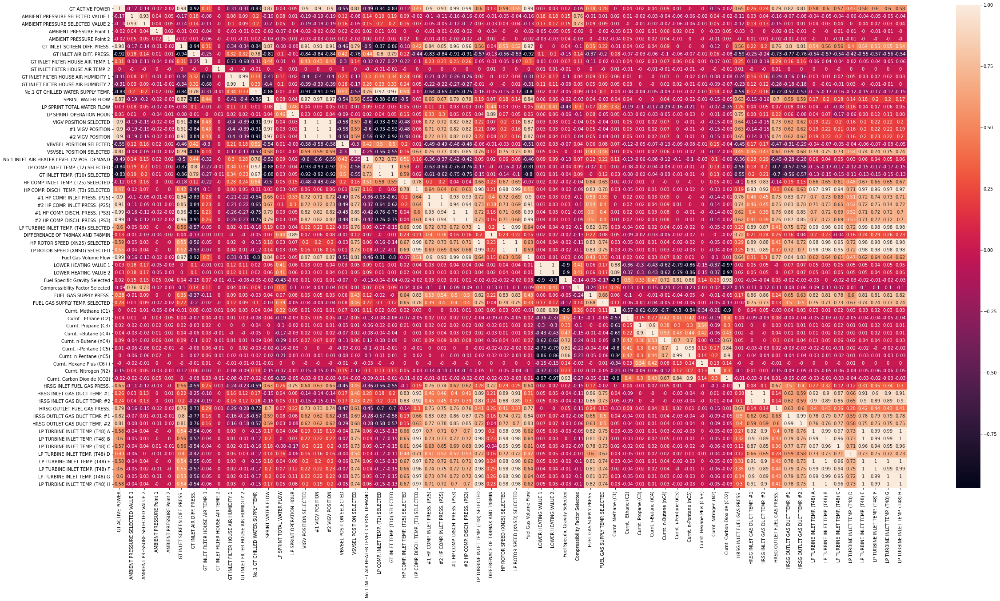

In [23]:
corr = features.corr()
plt.figure(figsize=(40,20))
sns.heatmap(corr.round(2), annot=True)
plt.show()

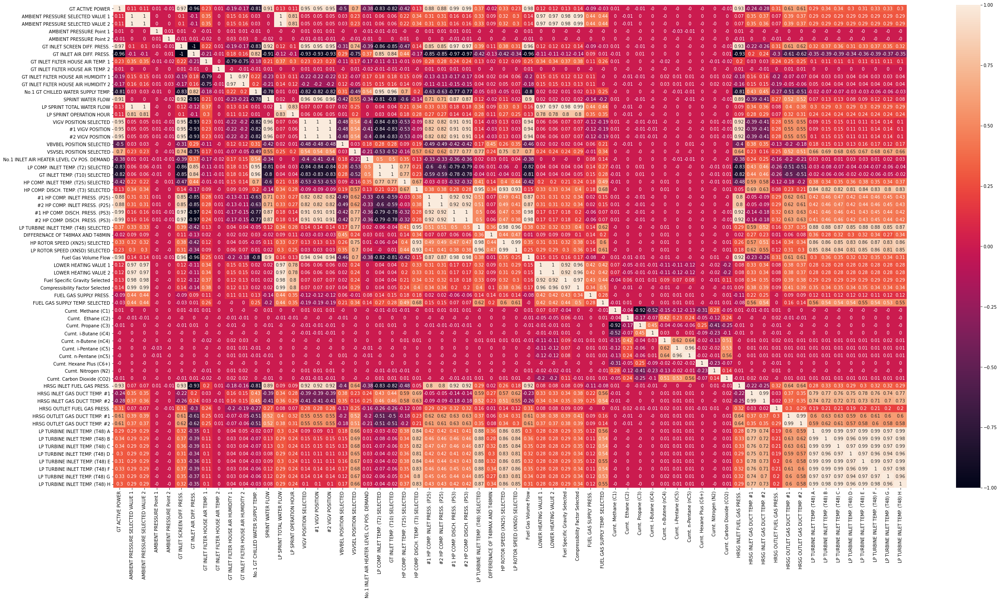

In [24]:
corr = features_diff.corr()
plt.figure(figsize=(40,20))
sns.heatmap(corr.round(2), annot=True)
plt.show()

In [25]:
gt1_features = mod_data_df[mod_data_df['GT Number']==1].iloc[:, 3:]
gt1_features_diff = gt1_features.diff().fillna(0)

gt2_features = mod_data_df[mod_data_df['GT Number']==2].iloc[:, 3:]
gt2_features_diff = gt2_features.diff().fillna(0)

mod_features = gt1_features.append(gt2_features)
mod_features_diff = gt1_features_diff.append(gt2_features_diff)

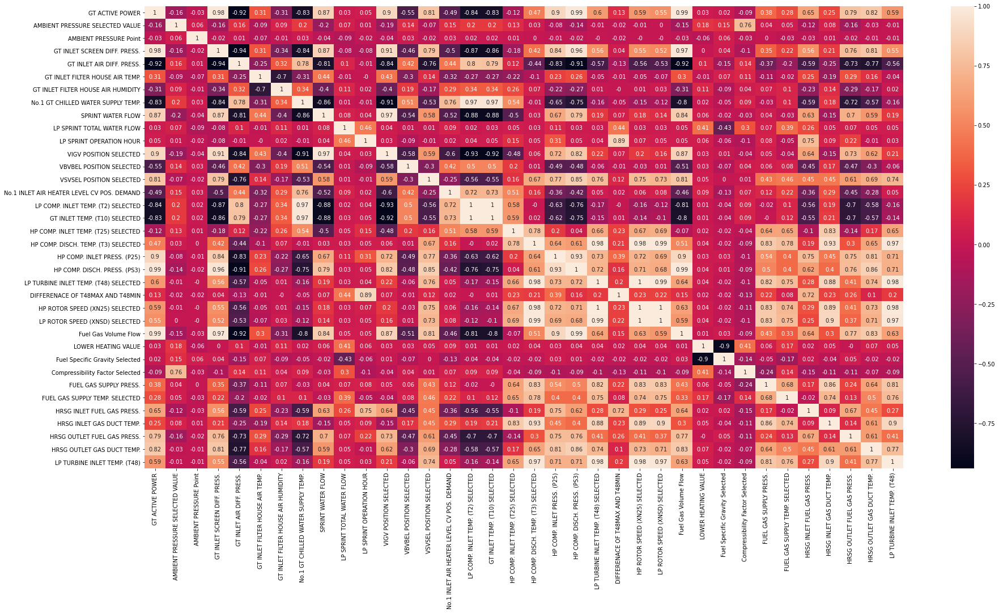

In [27]:
corr = mod_features.corr()
plt.figure(figsize=(30,15))
sns.heatmap(corr.round(2), annot=True)
plt.show()

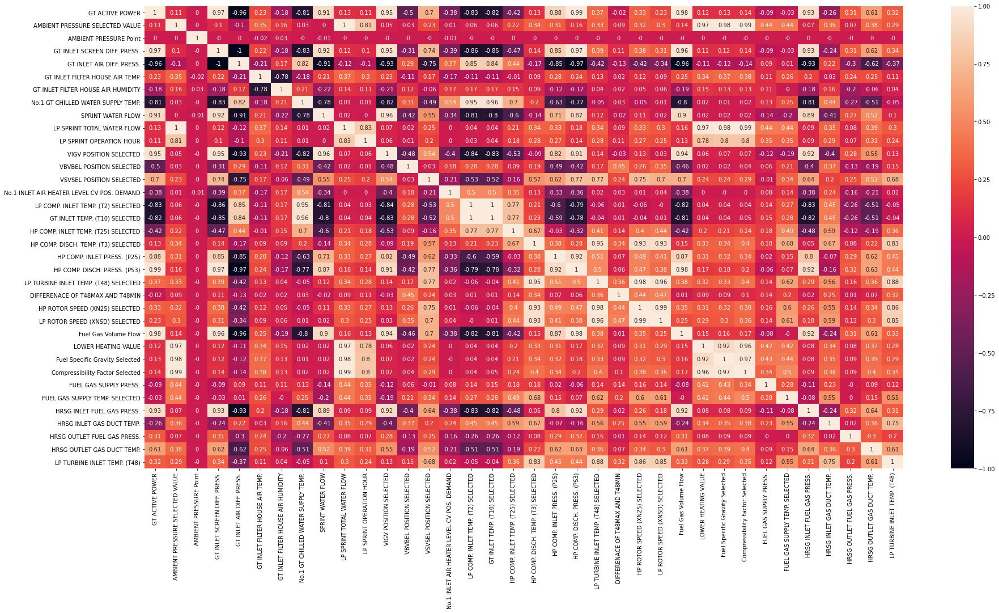

In [28]:
corr = mod_features_diff.corr()
plt.figure(figsize=(30,15))
sns.heatmap(corr.round(2), annot=True)
plt.show()

In [26]:
data_filename = 'GSPP11_data_merge_reduce'
pickle.dump(mod_data_df, open(data_filename + '.pickle', 'wb'))